In [1]:
%matplotlib inline
from imagenet_utils import preprocess_input
from keras.preprocessing import image
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.colors as mcolor
import numpy as np
import h5py
import os
import tensorflow as tf
from PIL import Image
import re
from scipy.spatial.distance import cosine as cosine_distance
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from tqdm import tqdm
from vgg19 import VGG19
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam, SGD
from keras.backend.tensorflow_backend import set_session

config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.25
set_session(tf.Session(config=config))

Using TensorFlow backend.


In [2]:
class Util:
    video = None
    base_path = None
    features = None
    
    @staticmethod
    def stringify(i):
        return 'fig{0:08d}.jpg'.format(i)
    
    @staticmethod
    def get_integer(s):
        match = re.match(r'fig(\d+)\.jpg', s)

        if match: return int(match.group(1))
        else: return None
        
    @staticmethod
    def open_image_as_array(frame):
        im = Image.open(os.path.join(base_path, video, frame))
        return np.asarray(im, dtype=float) / 255
    
    @staticmethod
    def set_props(_base_path, _video):
        base_path = _base_path
        video = _video
        
    @staticmethod
    def set_features(_features):
        Util.features = _features
        
    @staticmethod
    def get_features():
        return Util.features
        
    @staticmethod
    def correlate_distances(frames, do_plot=False):
        dist_matrix = []
        dist_nonself_matrix = {}
        dist_dense_matrix = []
        index = 0

        for anchor_frame in frames:
            dist_matrix.append([])
            dist_nonself_matrix[anchor_frame] = {}
            dist_dense_matrix.append([])
            for compare_frame in frames:
                af = Util.features[anchor_frame]
                bf = Util.features[compare_frame]
                dist = cosine_distance(af, bf)
                dist_matrix[index].append(dist)

                #print('{0:s} <-> {1:s} = {2:.2f}'.format(anchor_frame, compare_frame, dist))

                if anchor_frame != compare_frame: 
                    dist_dense_matrix[index].append(dist)
                    dist_nonself_matrix[anchor_frame][compare_frame] = dist

            index = index + 1

        if do_plot:
            column_labels = frames
            row_labels = frames
            fig, axes = plt.subplots()
            heatmap = axes.pcolor(dist_matrix, cmap=plt.cm.Blues, alpha=0.8)
            fig = plt.gcf()
            fig.set_size_inches(8, 11)
            axes.set_yticks(np.arange(len(dist_matrix)) + 0.5, minor=False)
            axes.set_xticks(np.arange(len(dist_matrix)) + 0.5, minor=False)

            axes.set_xticklabels(frames, minor=False)
            axes.set_yticklabels(frames, minor=False)
            plt.xticks(rotation=90)
            plt.title('Keyframes Cosine Distance Correlation')

        return dist_dense_matrix, dist_nonself_matrix
    
    @staticmethod
    def generate_scenes(frames):
        scenes = []
        for f in range(0, len(frames)):
            f_min = Util.get_integer(frames[f])

            if f == 0 and f_min > 0:
                scenes.append([0, f_min])
            
            if (f + 1) > len(frames) - 1:
                f_max = len(Util.features) - 1
            else:
                f_max = Util.get_integer(frames[f + 1]) - 1

            scenes.append([f_min, f_max])
        return scenes

    @staticmethod
    def get_prominent_frames(frames):
        out_frames = []
        
        for scene in Util.generate_scenes(frames):
            max_sat = 0
            max_lv = 0
            prominent_frame = None
            for i in tqdm(range(scene[0], scene[1] + 1)):
                frame = Util.stringify(i)
                ia = Util.open_image_as_array(frame)
                sat, lv = SatLightStats.get_sv(ia)

                if (lv > max_lv):
                    max_lv = lv
                    prominent_frame = frame

            out_frames.append(prominent_frame)
            plt.figure()
            im = Image.open(os.path.join(base_path, video, prominent_frame))
            ia = np.asarray(im)
            imshow(ia)
            plt.title(prominent_frame)

        return out_frames
    
    @staticmethod
    def dump_frames(frames):
        for frame in frames:
            plt.figure()
            ia = Util.open_image_as_array(frame)
            imshow(ia)
            plt.title(frame)
            
    @staticmethod
    def dump_frame_index(frames):
        path = os.path.join(base_path, video, 'keyframes.txt')
        with open(path, 'w') as f:
            for frame in frames:
                fi = str(Util.get_integer(frame))
                print(fi)
                f.write(fi + "\n")
                
        print('Keyframes info written to ' + path)
        
    @staticmethod
    def pack_features(frames):
        pack_frames, pack_features = Util.pack(frames)

        with (h5py.File('features_' + video + '.h5', 'w')) as f:
            f.create_dataset('frames', data=pack_frames)
            f.create_dataset('features', data=pack_features)
        #f = h5py.File(out, 'w')
        #f.create_dataset('features', data=Util.features)
        #f.close()
        
    @staticmethod
    def pack(frames):
        frame_data = np.zeros((len(frames), 1), dtype=int)
        features_data = np.zeros((len(frames), 7*7*512), dtype=float)
        
        for index, frame in enumerate(frames):
            frame_data[index] = (Util.get_integer(frame))
            
        for index, frame in enumerate(frames):
            fl = Util.features[frame].flatten()
            features_data[index,:] = Util.features[frame].flatten()
        
        return frame_data, features_data
    

In [3]:
class SatLightStats:
    max_val = 352 * 288
    @staticmethod
    def get_sv(a):
        hsv = mcolor.rgb_to_hsv(a)
        
        saturation = np.sum(hsv[:,:,1])
        lightness = np.sum(hsv[:,:,2])

        return saturation / SatLightStats.max_val, lightness / SatLightStats.max_val
    
    @staticmethod
    def get_stats_min():
        sats = []
        lvs = []

        for frame in tqdm(Util.get_features()):
            #im = Image.open(os.path.join(base_path, video, frame))
            ia = Util.open_image_as_array(frame)#np.asarray(im)
            sat, lv = SatLightStats.get_sv(ia)
            sats.append(sat)
            lvs.append(lv)

        sat_stdev = np.std(sats)
        sat_mean = np.mean(sats)
        lv_stdev = np.std(lvs)
        lv_mean = np.mean(lvs)

        return sat_mean - sat_stdev, lv_mean - lv_stdev
    
    @staticmethod
    def filter_by_lightness(frames):
        sat_lb, lv_lb = SatLightStats.get_stats_min()
        new_frames = []
        for frame in frames:
            ia = Util.open_image_as_array(frame)
            sat, lv = SatLightStats.get_sv(ia)
            
            if (lv > lv_lb):
                new_frames.append(frame)
                
        return new_frames

In [4]:
class KeyFrameExtractor:
    features = {}
    model = VGG19(weights='imagenet', include_top=False)
    base_path = None
    video = None
    
    def __init__(self, base_path, video):
        self.features = {}
        self.base_path = base_path
        self.video = video
        
    def get_feature(self, fig):
        path = os.path.join(self.base_path, self.video, 'fig{0:08d}.jpg'.format(fig))
        img = image.load_img(path, target_size=(224,224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        return self.model.predict(x)
    
    def build_features(self):
        for filename in tqdm(sorted(os.listdir(os.path.join(self.base_path, self.video)))):
            digit = Util.get_integer(filename)

            if digit is not None:
                self.features[filename] = self.get_feature(digit).flatten()
    
    def get_features(self):
        return self.features

In [5]:
class FirstOrderDifferentiator:
    init_threshold = 0.5
    dist_frame_max = 300
    dist_frame_min = 40
    keyframes = []
    best_efforts = {}
    
    current_frame = 1
    last_keyframe = 0
    dyna_threshold = init_threshold
    differentiator = 0
    differentiator_has_been_set = False
    min_differentiator = 0.001
    dflt_gave_up = False
    dfgt_gave_up = False
    features = []
    
    def __init__(self):
        self.keyframes = []
        self.keyframes.append(Util.stringify(0))
        self.init_threshold = 0.5
        self.dist_frame_max = 300
        self.dist_frame_min = 40
        self.best_efforts = {}
        
        self.current_frame = 1
        self.last_keyframe = 0
        self.dyna_threshold = self.init_threshold
        self.differentiator = 0
        self.differentiator_has_been_set = False
        self.min_differentiator = 0.001
        self.dflt_gave_up = False
        self.dfgt_gave_up = False
        self.features = Util.get_features()
        
    def compute(self):
        while True:
            dist = self.compute_distance()

            if dist > self.dyna_threshold or self.is_last_frame():
                dflt = self.delta_frame_less_than_threshold()
                dfgt = self.delta_frame_greater_than_threshold()

                if dflt:
                    self.reset_to_last_keyframe()
                    self.set_threshold('higher')
                elif dfgt:
                    self.reset_to_last_keyframe()
                    self.set_threshold('lower')
                else: 
                    if self.dflt_gave_up and self.dfgt_gave_up:
                        self.find_best_effort_differentiator()
                    else:
                        self.add_keyframe()

                    self.reset_differentiator()
                    
            if not self.next_frame():
                break;
        
    def compute_distance(self):
        si_0 = Util.stringify(self.current_frame - 1)
        si_1 = Util.stringify(self.current_frame)
        return cosine_distance(self.features[si_0], self.features[si_1])
    
    def is_last_frame(self):
        return self.current_frame == (len(self.features) - 1)
    
    def find_best_effort_differentiator(self):
        delta_delta = 999999
        best_effort = None
        for _delta_frame, diffs in self.best_efforts.items():
            zdelta = 0
            delta_frame = int(_delta_frame)
            if delta_frame <  self.dist_frame_min:
                zdelta = abs(self.dist_frame_min - delta_frame)
            elif delta_frame > self.dist_frame_max:
                zdelta = abs(self.dist_frame_max - delta_frame)

            if zdelta < delta_delta:
                delta_delta = zdelta
                best_effort = self.best_efforts[_delta_frame][0]

        print('Best effort delta is ' + str(delta_delta))
        self.current_frame = self.last_keyframe + delta_delta
        self.last_keyframe = self.current_frame
        print('YYY Using best effort differentiator. Current frame set to {0:d}', self.current_frame)
        
    def add_keyframe(self):
        print('Adding to keyframe {0:s}, delta_frame = {1:d}'.format(Util.stringify(self.current_frame), self.current_frame - self.last_keyframe))
        self.keyframes.append(Util.stringify(self.current_frame))
        self.last_keyframe = self.current_frame
        
    def differentiator_too_low(self):
        if self.differentiator_has_been_set:
            return self.differentiator < self.min_differentiator

        return False
    
    def delta_frame_less_than_threshold(self):
        if self.differentiator_too_low(): 
            self.dflt_gave_up = True
            return False

        return (self.current_frame - self.last_keyframe) < self.dist_frame_min
    
    def delta_frame_greater_than_threshold(self):
        if self.differentiator_too_low(): 
            self.dfgt_gave_up = True
            return False

        return (self.current_frame - self.last_keyframe) > self.dist_frame_max
    
    def next_frame(self):
        self.current_frame = self.current_frame + 1

        return self.current_frame < len(self.features)
    
    def reset_differentiator(self):
        self.differentiator = 0
        self.differentiator_has_been_set = False
        self.dflt_gave_up = False
        self.dfgt_gave_up = False
        self.best_efforts = {}

        if self.dyna_threshold > self.init_threshold:
            self.dyna_threshold = self.init_threshold
            
    def reset_to_last_keyframe(self):
        self.update_best_efforts()
        print('<-- Resetting from {0:d} to frame {1:d}'.format(self.current_frame, self.last_keyframe))
        self.current_frame = self.last_keyframe
            
    def set_threshold(self, mode):
        old_dyna_threshold = self.dyna_threshold

        if mode == 'lower':
            if self.differentiator == 0:
                self.differentiator = self.dyna_threshold
            else:
                self.differentiator = self.differentiator / 2

            self.dyna_threshold = self.dyna_threshold - self.differentiator / 2
        elif mode == 'higher':
            if self.differentiator == 0:
                self.differentiator = 1.0 - self.dyna_threshold
            else:
                self.differentiator = self.differentiator / 2

            self.dyna_threshold = self.dyna_threshold + self.differentiator / 2

        self.differentiator_has_been_set = True

        print('^^^ Adjusting threshold {0:.1f} -> {1:.1f} | d = {2:.4f}'.format(old_dyna_threshold, self.dyna_threshold, self.differentiator))
        
    def update_best_efforts(self):
        best_delta_frame = self.current_frame - self.last_keyframe
        if str(best_delta_frame) not in self.best_efforts:
            self.best_efforts[str(best_delta_frame)] = []

        self.best_efforts[str(best_delta_frame)].append(self.differentiator)
        
    def get_keyframes(self):
        return self.keyframes

In [6]:
class SimilarityMatcher:
    def __init__(self, frames, dense, friendly):
        self.dense = dense
        self.friendly = friendly
        self.frames = frames
        self.process()
        
    def process(self):
        new_frames = []
        similars = self.get_similar_keyframes()
        eliminated = self.vote_similars(similars)
        
        for frame in self.frames:
            if frame not in eliminated:
                new_frames.append(frame)
                
        return new_frames
        
    def get_dist_lower_bound(self):
        return np.mean(self.dense) - 2 * np.std(self.dense) # this is very arbitrary WTF???
    
    def get_dist_upper_bound(self):
        return np.mean(self.dense) + 2 * np.std(self.dense)
    
    def get_similar_keyframes(self):
        dist_lb = self.get_dist_lower_bound()
        similars = {}
        processed = set()

        for keyframe, kds in self.friendly.items():
            cviz = []
            for compframe, corr in kds.items():
                if corr < dist_lb:
                    cviz.append(compframe)

            if len(cviz) > 0:
                #im = Image.open(os.path.join(base_path, video, keyframe))
                #ia = np.asarray(im)
                #plt.figure()
                #plt.imshow(ia)
                #plt.title('Keyframe {0:s}'.format(keyframe))
                #print("Keyframe {0:s}".format(keyframe))

                if keyframe not in processed:
                    similars[keyframe] = []
                    processed.add(keyframe)
                for frame in cviz:
                    #im = Image.open(os.path.join(base_path, video, frame))
                    #ia = np.asarray(im)
                    #plt.figure()
                    #plt.imshow(ia)
                    #plt.title('Similar frame {0:s}'.format(frame))
                    #print(" --> Similar frame {0:s}".format(frame))

                    if frame not in processed:
                        if keyframe in similars:
                            similars[keyframe].append(frame)
                            processed.add(frame)

        return similars
    
    def vote_similars(self, h):
        candidates = []
        for a, ss in h.items():
            candidates.append(a)
            for s in ss: candidates.append(s)

        eliminated = self.vote(candidates)
        return eliminated
    
    def vote(self, candidates):
        max_lv = 0
        max_cand = None
        remaining = candidates

        for candidate in candidates:
            ia = Util.open_image_as_array(candidate)
            sat, lv = SatLightStats.get_sv(ia)

            if lv > max_lv:
                max_lv = lv
                max_cand = candidate
            else:
                remaining.remove(candidate)

        return remaining

In [7]:
class SecondPass:
    def __init__(self, scenes):
        self.scenes = scenes
        
    def get_frames(self):
        return self.frames
        
    def process(self, variance=0.8):
        self.variance = variance
        new_frames = []
        for scene in self.scenes:
            frames = []

            for f in range(scene[0], scene[1] + 1):
                frames.append(Util.stringify(f))

            print('Analyzing frames {0:d} to {1:d}...'.format(scene[0], scene[1] + 1))
            dense, nonself = Util.correlate_distances(frames, do_plot=False)

            if len(dense) > 1:
                n_components = self.try_fit_pca(dense)
                new_clusters = self.get_new_frames(dense, frames, n_components)

                for new_frame in sorted(new_clusters):
                    new_frames.append(new_frame)

                    plt.figure()
                    im = Image.open(os.path.join(base_path, video, new_frame))
                    ia = np.asarray(im)
                    imshow(ia)

                    if new_frame not in step3frames:
                        plt.title('{0:d} new_frame -> {1:s}'.format(scene[0], new_frame))
                    else:
                        plt.title('{0:d}'.format(scene[0]))
                print('PCA components = {0:d}'.format(n_components))
                print(new_clusters)
            
        return new_frames
    
    def get_new_frames(self, a, frames, n_components):
        if n_components == 1: return [frames[0]]
    
        spc = AgglomerativeClustering(n_components) #SpectralClustering(n_components)
        spc.fit(a)

        labels = (spc.labels_)
        member_count = len(a)
        clusters = [None] * n_components

        i = member_count - 1
        for j in reversed(labels):
            clusters[j] = frames[i]
            i = i - 1

        return clusters

    def try_fit_pca(self, a):
        for n in range(1,32):
            pca = PCA(n_components=n)
            pca.fit(a)

            sum_var = 0
            for vratio in pca.explained_variance_ratio_:
                sum_var = sum_var + vratio

            if sum_var > self.variance:
                return n

In [8]:
video = 'michael_day2'
base_path = '/home/gbudiman/Documents/effigy/figs'
Util.set_props(base_path, video)
kfx = KeyFrameExtractor(base_path, video)
kfx.build_features()
Util.set_features(kfx.get_features())

100%|██████████| 6000/6000 [01:23<00:00, 72.14it/s]


In [9]:
fod = FirstOrderDifferentiator()
fod.compute()
step1frames = fod.get_keyframes()

<-- Resetting from 308 to frame 0
^^^ Adjusting threshold 0.5 -> 0.2 | d = 0.5000
Adding to keyframe fig00000058.jpg, delta_frame = 58
<-- Resetting from 60 to frame 58
^^^ Adjusting threshold 0.2 -> 0.6 | d = 0.7500
<-- Resetting from 1680 to frame 58
^^^ Adjusting threshold 0.6 -> 0.4 | d = 0.3750
Adding to keyframe fig00000308.jpg, delta_frame = 250
<-- Resetting from 309 to frame 308
^^^ Adjusting threshold 0.4 -> 0.7 | d = 0.5625
<-- Resetting from 1680 to frame 308
^^^ Adjusting threshold 0.7 -> 0.6 | d = 0.2812
Adding to keyframe fig00000448.jpg, delta_frame = 140
<-- Resetting from 449 to frame 448
^^^ Adjusting threshold 0.5 -> 0.8 | d = 0.5000
<-- Resetting from 5996 to frame 448
^^^ Adjusting threshold 0.8 -> 0.6 | d = 0.2500
<-- Resetting from 1680 to frame 448
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.1250
<-- Resetting from 1680 to frame 448
^^^ Adjusting threshold 0.6 -> 0.5 | d = 0.0625
<-- Resetting from 449 to frame 448
^^^ Adjusting threshold 0.5 -> 0.5 | d = 0.0312

<-- Resetting from 5996 to frame 2700
^^^ Adjusting threshold 0.7 -> 0.6 | d = 0.2812
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.1406
<-- Resetting from 5398 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0703
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0352
<-- Resetting from 5398 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0176
<-- Resetting from 5398 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0088
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0044
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0022
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0011
<-- Resetting from 2701 to frame 2700
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0005
Best effort delta is 39
YYY Using best effort differentiator. Current frame set to {0:d} 2739
<-- Resetting from 4571 to frame 2739
^^^ Adju

In [10]:
step2frames = SatLightStats.filter_by_lightness(step1frames)

100%|██████████| 5997/5997 [01:30<00:00, 66.04it/s]


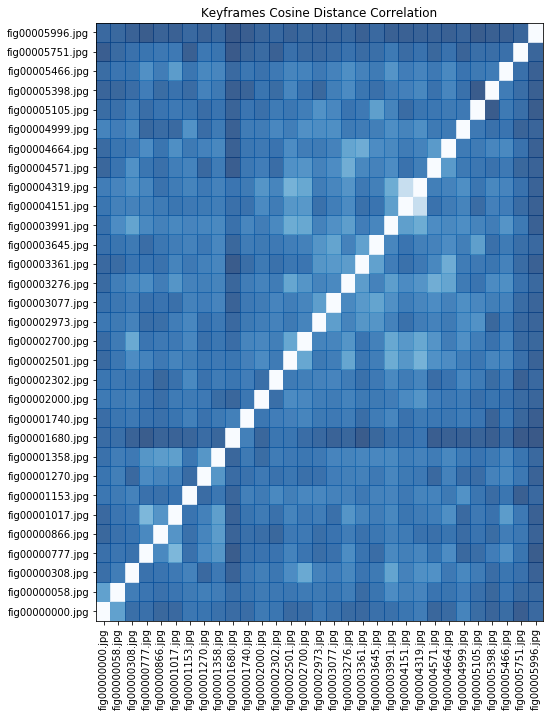

In [11]:
dense, friendly = Util.correlate_distances(step2frames, do_plot=True)

In [12]:
#simm = SimilarityMatcher(step2frames, dense, friendly)
#step3frames = simm.process()

In [13]:
#dense, friendly = Util.correlate_distances(step3frames, do_plot=True)

In [14]:
step3frames = step2frames
scenes = Util.generate_scenes(step3frames)

Analyzing frames 0 to 58...
PCA components = 2
['fig00000030.jpg', 'fig00000000.jpg']
Analyzing frames 58 to 308...
PCA components = 3
['fig00000058.jpg', 'fig00000190.jpg', 'fig00000084.jpg']
Analyzing frames 308 to 777...
PCA components = 3
['fig00000308.jpg', 'fig00000546.jpg', 'fig00000314.jpg']
Analyzing frames 777 to 866...
PCA components = 1
['fig00000777.jpg']
Analyzing frames 866 to 1017...
PCA components = 3
['fig00000930.jpg', 'fig00000866.jpg', 'fig00000868.jpg']
Analyzing frames 1017 to 1153...
PCA components = 3
['fig00001029.jpg', 'fig00001017.jpg', 'fig00001076.jpg']
Analyzing frames 1153 to 1270...
PCA components = 2
['fig00001188.jpg', 'fig00001153.jpg']
Analyzing frames 1270 to 1358...
PCA components = 2
['fig00001270.jpg', 'fig00001277.jpg']
Analyzing frames 1358 to 1680...


/home/gbudiman/anaconda3/envs/effigy/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


PCA components = 3
['fig00001358.jpg', 'fig00001361.jpg', 'fig00001360.jpg']
Analyzing frames 1680 to 1740...
PCA components = 2
['fig00001701.jpg', 'fig00001680.jpg']
Analyzing frames 1740 to 2000...
PCA components = 4
['fig00001740.jpg', 'fig00001888.jpg', 'fig00001953.jpg', 'fig00001845.jpg']
Analyzing frames 2000 to 2302...
PCA components = 2
['fig00002004.jpg', 'fig00002000.jpg']
Analyzing frames 2302 to 2501...
PCA components = 2
['fig00002313.jpg', 'fig00002302.jpg']
Analyzing frames 2501 to 2700...
PCA components = 2
['fig00002501.jpg', 'fig00002504.jpg']
Analyzing frames 2700 to 2973...
PCA components = 3
['fig00002701.jpg', 'fig00002700.jpg', 'fig00002909.jpg']
Analyzing frames 2973 to 3077...
PCA components = 2
['fig00002973.jpg', 'fig00002997.jpg']
Analyzing frames 3077 to 3276...
PCA components = 2
['fig00003077.jpg', 'fig00003106.jpg']
Analyzing frames 3276 to 3361...
PCA components = 1
['fig00003276.jpg']
Analyzing frames 3361 to 3645...
PCA components = 2
['fig00003361.

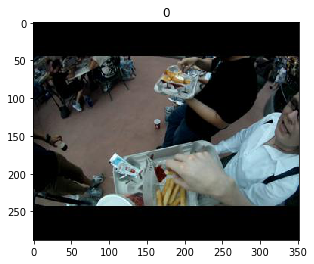

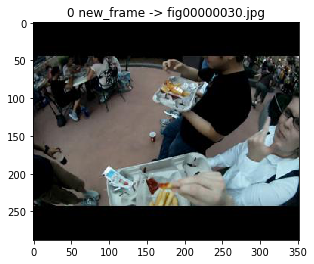

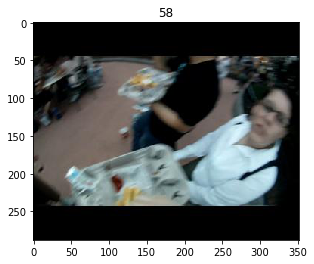

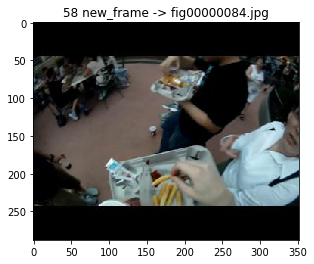

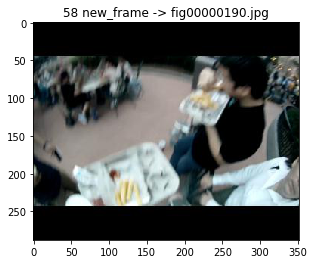

...

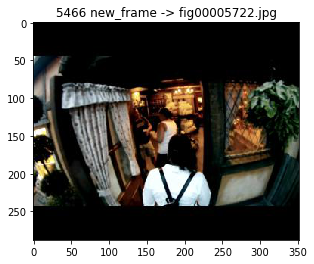

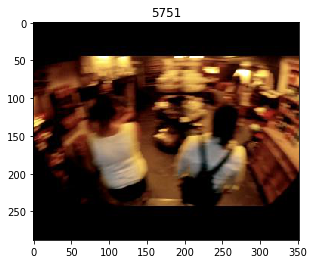

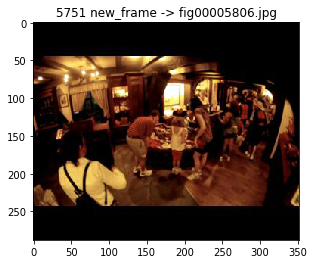

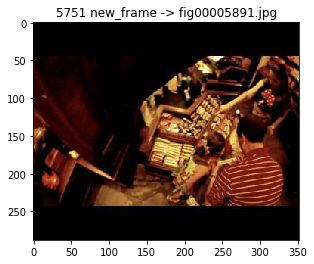

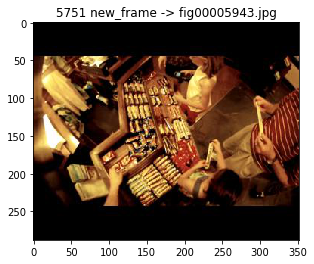

In [15]:
second_pass = SecondPass(scenes)
step4frames = second_pass.process(variance=0.8)

In [16]:
#step5frames = Util.get_prominent_frames(step4frames)
step5frames = step4frames


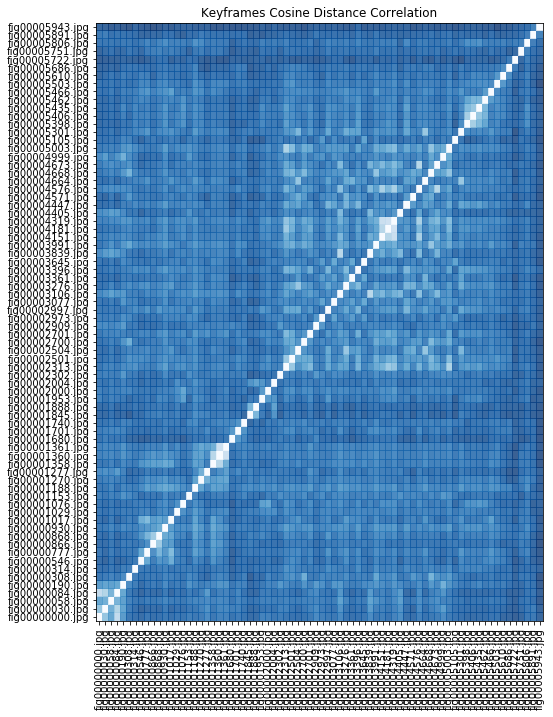

In [17]:
dense, friendly = Util.correlate_distances(step5frames, do_plot=True)

In [18]:
simm = SimilarityMatcher(step5frames, dense, friendly)
step6frames = simm.process()


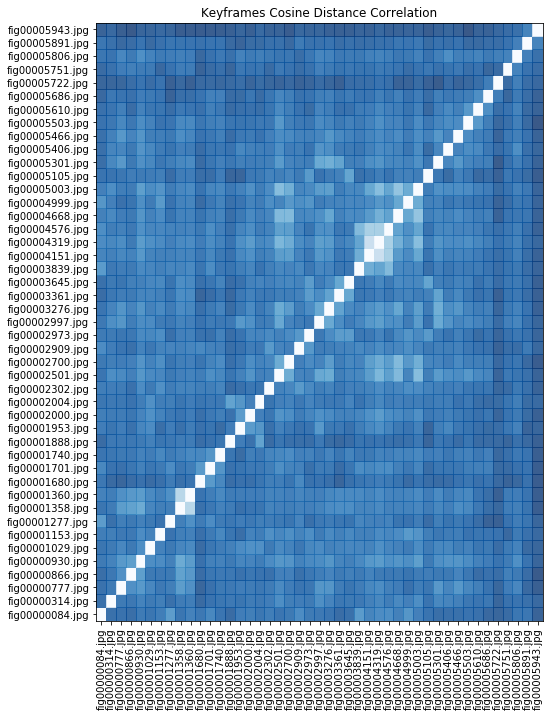

In [19]:
dense, friendly = Util.correlate_distances(step6frames, do_plot=True)

/home/gbudiman/anaconda3/envs/effigy/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


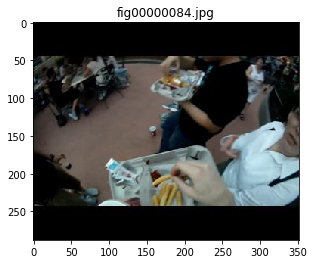

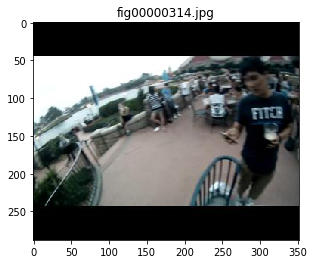

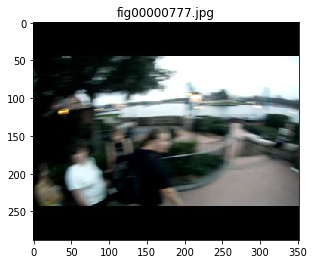

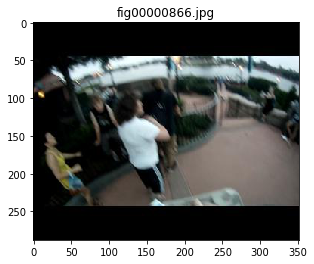

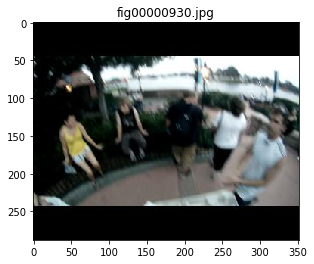

...

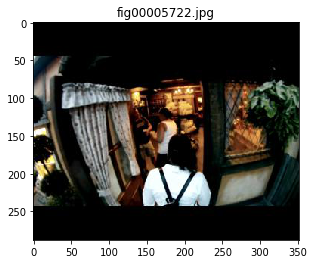

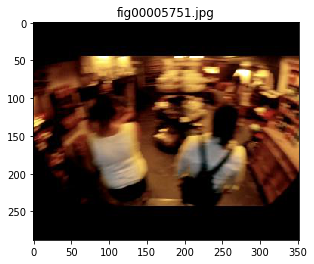

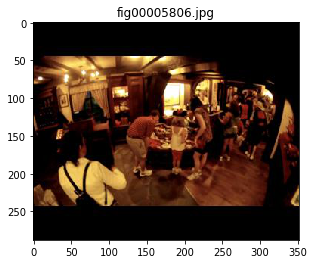

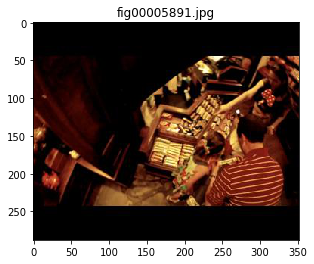

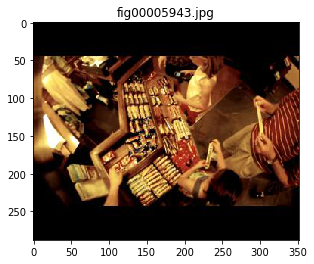

In [20]:
Util.dump_frames(step6frames)

In [21]:
Util.dump_frame_index(step6frames)

84
314
777
866
930
1029
1153
1277
1358
1360
1680
1701
1740
1888
1953
2000
2004
2302
2501
2700
2909
2973
2997
3276
3361
3645
3839
4151
4319
4576
4668
4999
5003
5105
5301
5406
5466
5503
5610
5686
5722
5751
5806
5891
5943
Keyframes info written to /home/gbudiman/Documents/effigy/figs/michael_day2/keyframes.txt


In [22]:
Util.pack_features(step6frames)